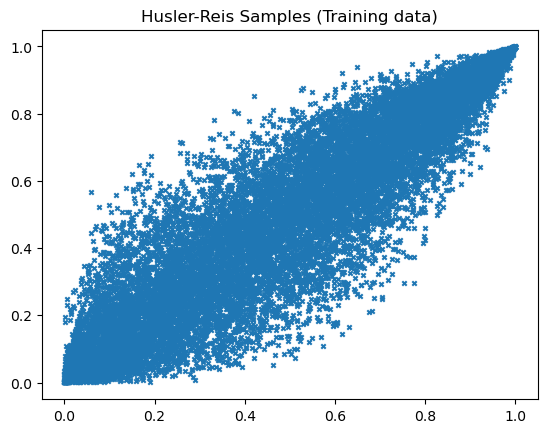

In [2]:
from HuslerReisVAE import uniformity_penalty, custom_loss, dataHR, eval_dataHR
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import IPython.display as display
from scipy.interpolate import PchipInterpolator
import sys
import os
import numpy as np
from statsmodels.distributions.empirical_distribution import ECDF
models_path = os.path.abspath(os.path.join(os.getcwd(), '..', r'Models'))
if models_path not in sys.path:
    sys.path.append(models_path)
from LogitNormalVAE import *
dataHR_2 = np.load("dataHR_2.npy")
negative_log_likelihood = lambda x, rv_x: -rv_x.log_prob(x)


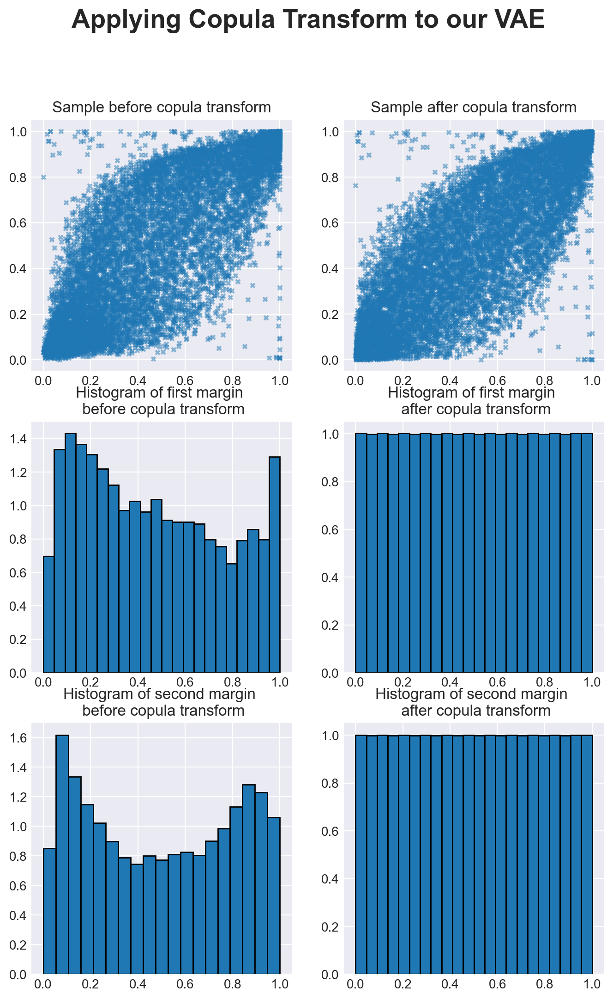

In [56]:
model = Std_VAE_LogitNormal(latent_dim=12, input_dim = 2, LAYER_1_N=10,
                          LAYER_2_N = 12, KL_WEIGHT=0.1)
model.load_weights("best_model_LogitNormal_2")

gen_sample = model.decoder(model.encoder.prior.sample(10000)).sample()

# empirical cdf functions
ecdf_margin_1 = ECDF(np.array(gen_sample[:, 0]))
ecdf_margin_2 = ECDF(np.array(gen_sample[:, 1]))

# new data, but with uniform margins
unif_dim_1 = ecdf_margin_1(np.array(gen_sample[:, 0]))
unif_dim_2 = ecdf_margin_2(np.array(gen_sample[:, 1]))

# visuals
num_rows = 3
num_cols = 2
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
axes[0,0].scatter(gen_sample[:,0], gen_sample[:,1], s=10, marker='x', alpha=0.5)
axes[0,0].set_title('Sample before copula transform')
axes[0,1].scatter(unif_dim_1, unif_dim_2, s=10, marker='x', alpha=0.5)
axes[0,1].set_title(f'Sample after copula transform')
axes[1,0].hist(gen_sample[:,0], bins='auto', edgecolor='black', density=True)
axes[1,0].set_title(f'Histogram of first margin \n before copula transform')
axes[1,1].hist(unif_dim_1, bins='auto', edgecolor='black', density=True)
axes[1,1].set_title(f'Histogram of first margin \n after copula transform')
axes[2,0].hist(gen_sample[:,1], bins='auto', edgecolor='black', density=True)
axes[2,0].set_title(f'Histogram of second margin \n before copula transform')
axes[2,1].hist(unif_dim_2, bins='auto', edgecolor='black', density=True)
axes[2,1].set_title(f'Histogram of second margin \n after copula transform')
fig.suptitle("Applying Copula Transform to our VAE", fontsize=20, fontweight='bold')
plt.show()

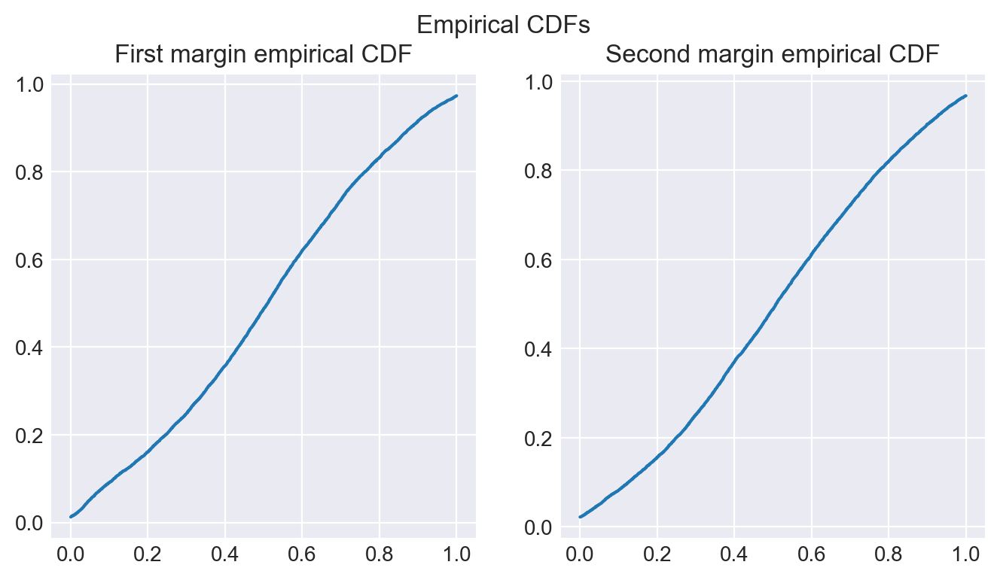

In [136]:
num_rows = 1
num_cols = 2
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
x_ax = np.linspace(0,1,10000)
axes[0].plot(x_ax, ecdf_margin_1(x_ax))
axes[0].set_title("First margin empirical CDF")
axes[1].plot(x_ax, ecdf_margin_2(x_ax))
axes[1].set_title("Second margin empirical CDF")
fig.suptitle("Empirical CDFs")
plt.show()

These are very cool results, as the copula transform seems a very effective way to guarantee our data is in the [0,1] hypercupe and that our margins are uniform. This begs the question: Now that we have this, is it still relevant to have the Logit Normal bijector whose primary goal was to ensure that our generated data would fall in this interval? Does it make for a better form or is it simply adding a layer of complexity that's no longer needed? To comment on this, we retrain a regular VAE without any Logit Normal bijectors and compare the form of the simulated data with the original copula

In [59]:
class Std_Encoder(tfk.Model): #Encodeur
    
    def __init__(self, num_neurons=100, kl_weight=0.1, activation='relu'):      
        super(Std_Encoder,self).__init__()
        self.encoded_size = 12 #taille de l'espace latent
        self.num_neurons = num_neurons
        self.kl_weight = kl_weight
        self.activation = activation
        self.prior        = tfd.MultivariateNormalDiag(loc=tf.zeros(self.encoded_size))
        self.dense1       = tfkl.Dense(self.num_neurons, activation=self.activation)
        self.dense2       = tfkl.Dense(self.num_neurons, activation=self.activation)
        self.dense3       = tfkl.Dense(tfpl.IndependentNormal.params_size(self.encoded_size))
        self.ind_norm1    = tfpl.IndependentNormal(self.encoded_size,
                                                   activity_regularizer=tfpl.KLDivergenceRegularizer(self.prior,
                                                                                                     weight=self.kl_weight))
        
    def call(self, inputs):
        x = self.dense1(inputs)
        x = self.dense2(x)
        x = self.dense3(x)
        x = self.ind_norm1(x)
        return x

class Std_Decoder(tfk.Model): #Décodeur
    def __init__(self, num_neurons=100, activation='relu'):
        super(Std_Decoder,self).__init__()
        self.K         = 2
        self.num_neurons = num_neurons
        self.activation = activation
        self.dense1    = tfkl.Dense(self.num_neurons, use_bias=True, activation=self.activation)
        self.dense2    = tfkl.Dense(self.num_neurons, use_bias=True, activation=self.activation)
        self.dense3    = tfkl.Dense(tfpl.IndependentNormal(self.K).params_size(self.K))
        self.ind_norm1 = tfpl.IndependentNormal(self.K)
        
        
    def call(self, inputs):
        x = self.dense1(inputs)
        x = self.dense2(x)
        x = self.dense3(x)
        x = self.ind_norm1(x)
        return x

class Std_VAE(tfk.Model):
    def __init__(self, num_neurons_encoder=100, num_neurons_decoder=100, kl_weight=0.1, activation='relu'):      
        super(Std_VAE,self).__init__()
        self.num_neurons_encoder = num_neurons_encoder
        self.num_neurons_decoder = num_neurons_decoder
        self.kl_weight=kl_weight
        self.activation = activation
        self.encoder = Std_Encoder(num_neurons=self.num_neurons_encoder, kl_weight=self.kl_weight, activation = self.activation)
        self.decoder = Std_Decoder(num_neurons=self.num_neurons_decoder, activation = self.activation)
    
    def call(self,inputs):
        return self.decoder(self.encoder(inputs))
    
    def generate_n_points(self, n):
        prior_points = self.encoder.prior.sample(n)
        gen_pre_transform = self.decoder(prior_points).sample()

        list_of_unifs = []
        for i in range(gen_pre_transform.shape[1]):
            unif = ECDF(np.array(gen_pre_transform[:,i]))(np.array(gen_pre_transform[:,i]))
            unif = unif[:, np.newaxis]
            list_of_unifs.append(unif)

        frame = np.concatenate(tuple(list_of_unifs), axis=1)
        return frame

Epoch 1/100

469/469 [==============================] - 4s 2ms/step - loss: 0.8395
Epoch 2/100
469/469 [==============================] - 1s 2ms/step - loss: 0.3567
Epoch 3/100
469/469 [==============================] - 1s 1ms/step - loss: 0.2875
Epoch 4/100
469/469 [==============================] - 1s 1ms/step - loss: 0.2439
Epoch 5/100
469/469 [==============================] - 1s 1ms/step - loss: 0.1916
Epoch 6/100
469/469 [==============================] - 1s 2ms/step - loss: 0.1199
Epoch 7/100
469/469 [==============================] - 1s 2ms/step - loss: 0.0432
Epoch 8/100
469/469 [==============================] - 1s 2ms/step - loss: -0.1312
Epoch 9/100
469/469 [==============================] - 1s 1ms/step - loss: -0.6231
Epoch 10/100
469/469 [==============================] - 1s 2ms/step - loss: -0.8591
Epoch 11/100
469/469 [==============================] - 1s 2ms/step - loss: -0.9120
Epoch 12/100
469/469 [==============================] - 1s 3ms/step - loss: -0.9350
Epoch 1

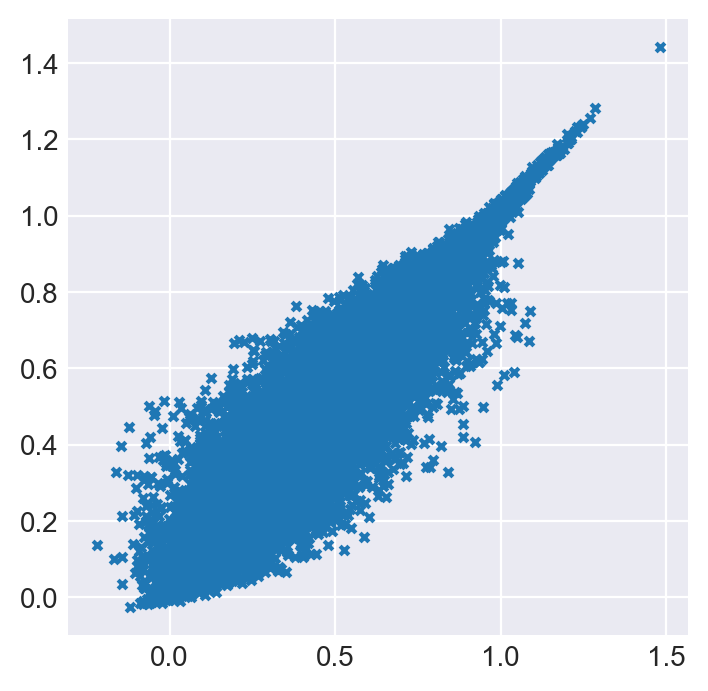

In [18]:
vae_cop = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4)
vae_cop.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
            loss=negative_log_likelihood)
vae_cop.fit(dataHR, dataHR, batch_size=32, epochs=100)
prior_sample = vae_cop.encoder.prior.sample(10000)
generated = vae_cop.decoder(prior_sample).sample()

plt.style.use("seaborn-v0_8-darkgrid")
plt.figure(figsize=(4, 4), dpi=200)
plt.scatter(generated[:,0], generated[:,1], marker="x", s=10)

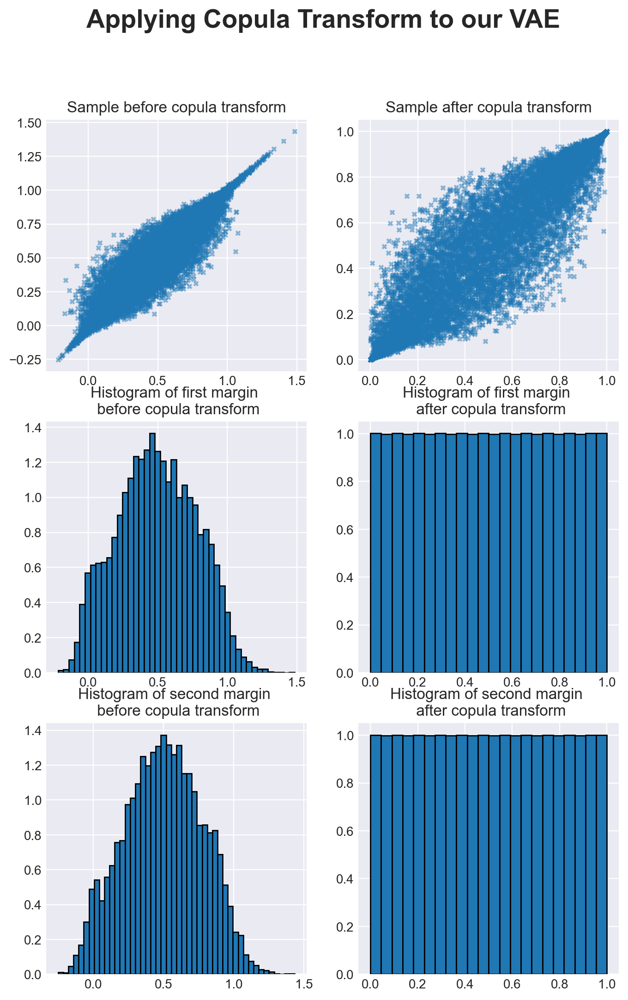

In [20]:
ecdf_margin_1 = ECDF(np.array(generated[:, 0]))
ecdf_margin_2 = ECDF(np.array(generated[:, 1]))

# new data, but with uniform margins
unif_dim_1_no_logit = ecdf_margin_1(np.array(generated[:, 0]))
unif_dim_2_no_logit = ecdf_margin_2(np.array(generated[:, 1]))

# visuals
num_rows = 3
num_cols = 2
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
axes[0,0].scatter(generated[:,0], generated[:,1], s=10, marker='x', alpha=0.5)
axes[0,0].set_title('Sample before copula transform')
axes[0,1].scatter(unif_dim_1_no_logit, unif_dim_2_no_logit, s=10, marker='x', alpha=0.5)
axes[0,1].set_title(f'Sample after copula transform')
axes[1,0].hist(generated[:,0], bins='auto', edgecolor='black', density=True)
axes[1,0].set_title(f'Histogram of first margin \n before copula transform')
axes[1,1].hist(unif_dim_1_no_logit, bins='auto', edgecolor='black', density=True)
axes[1,1].set_title(f'Histogram of first margin \n after copula transform')
axes[2,0].hist(generated[:,1], bins='auto', edgecolor='black', density=True)
axes[2,0].set_title(f'Histogram of second margin \n before copula transform')
axes[2,1].hist(unif_dim_2_no_logit, bins='auto', edgecolor='black', density=True)
axes[2,1].set_title(f'Histogram of second margin \n after copula transform')
fig.suptitle("Applying Copula Transform to our VAE", fontsize=20, fontweight='bold')
plt.show()

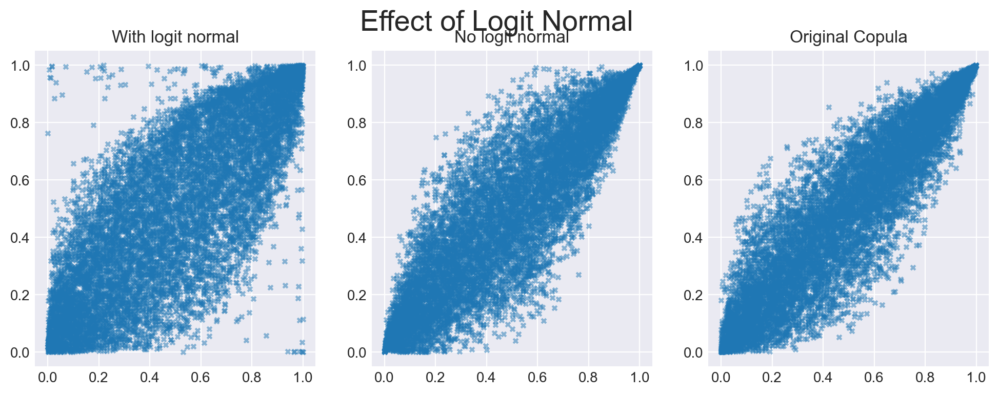

In [78]:
num_rows = 1
num_cols = 3
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
axes[0].scatter(unif_dim_1, unif_dim_2, s=10, marker='x', alpha=0.5)
axes[0].set_title('With logit normal')
axes[1].scatter(unif_dim_1_no_logit, unif_dim_2_no_logit, s=10, marker='x', alpha=0.5)
axes[1].set_title('No logit normal')
axes[2].scatter(dataHR[:,0][0:10000], dataHR[:,1][0:10000], s=10, marker='x', alpha=0.5)
axes[2].set_title('Original Copula')
fig.suptitle("Effect of Logit Normal", fontsize = 20)
plt.show()

We see that each have their strengths: Including a Logit Normal gives a better overall bulb shape in the central region, even though the bulb is 'fatter'. Howeverm, doing the Logit Normal also generates points near rhe ends of the hypercube, which are not in the original copula. Doing the regular VAE without Logit Normal addresses this: the dispersion of the points from the diagonal is close to what we see in the original copula. However, the shape is slightly less nice.

Let us compare different activation functions:

Epoch 1/100
469/469 [==============================] - 3s 2ms/step - loss: 0.8356
Epoch 2/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3656
Epoch 3/100
469/469 [==============================] - 1s 1ms/step - loss: 0.2728
Epoch 4/100
469/469 [==============================] - 1s 1ms/step - loss: 0.0967
Epoch 5/100
469/469 [==============================] - 1s 2ms/step - loss: -0.3222
Epoch 6/100
469/469 [==============================] - 1s 1ms/step - loss: -0.7859
Epoch 7/100
469/469 [==============================] - 1s 1ms/step - loss: -0.9095
Epoch 8/100
469/469 [==============================] - 1s 1ms/step - loss: -0.9843
Epoch 9/100
469/469 [==============================] - 1s 1ms/step - loss: -1.0016
Epoch 10/100
469/469 [==============================] - 1s 1ms/step - loss: -1.0064
Epoch 11/100
469/469 [==============================] - 1s 1ms/step - loss: -1.0271
Epoch 12/100
469/469 [==============================] - 1s 1ms/step - loss: -1.0386
Epoch

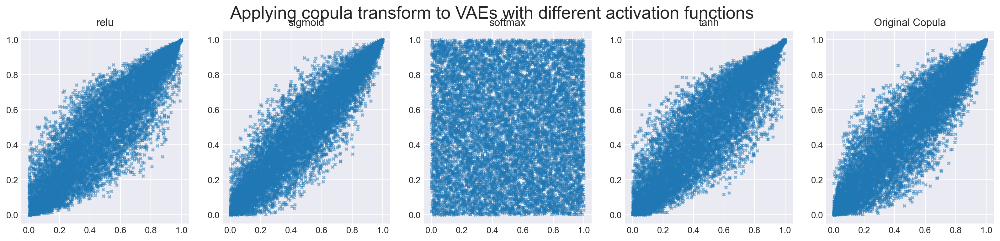

In [82]:
activations = ['relu', 'sigmoid', 'softmax', 'tanh']
num_rows = 1
num_cols = 5
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)

for i, act in enumerate(activations):
    
    # train model with specified activation function and 
    vae = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = act)
    vae.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
            loss=negative_log_likelihood)
    vae.fit(dataHR, dataHR, batch_size=32, epochs=100)
    prior_sample = vae.encoder.prior.sample(10000)
    generated = vae.decoder(prior_sample).sample()
    unif_marg_1 = ECDF(np.array(generated[:, 0]))(np.array(generated[:, 0]))
    unif_marg_2 = ECDF(np.array(generated[:, 1]))(np.array(generated[:, 1]))

    axes[i].scatter(unif_marg_1, unif_marg_2, s=10, marker='x', alpha=0.5)
    axes[i].set_title(act)

axes[4].scatter(dataHR[:,0][0:10000], dataHR[:,1][0:10000], s=10, marker='x', alpha=0.5)
axes[4].set_title('Original Copula')

fig.suptitle("Applying copula transform to VAEs with different activation functions", fontsize=20)
plt.show()


So sigmoid and relu seem to be the best options (relu has a very nice overall shape and seems to do well arounf the corners while relu has nice dispersion in the middle). For a more rigorous performance assessment, we turn to the Ghoudi-Khoudraji-Rivest test:

In [5]:
import numpy as np
from scipy.stats import rankdata, norm

def _gkr_statistic(x, y):
    """
    Internal helper — return S_n^{GKR} only (no variance, no jack-knife).
    """
    n = x.size
    # ranks
    rx = rankdata(x, method="average")
    ry = rankdata(y, method="average")

    # indicator matrix I_{ij}
    I = ((rx[:, None] >= rx[None, :]) &
         (ry[:, None] >= ry[None, :])).astype(np.int8)
    np.fill_diagonal(I, 0)

    # pair & triple terms
    A = I.sum()
    c = I.sum(axis=1)
    B = np.sum(c * (c - 1))

    # statistic
    S = (-1
         + 8.0 * A / (n * (n - 1))
         - 9.0 * B / (n * (n - 1) * (n - 2)))
    return S

def gkr_test(x, y):
    """
    Ghoudi-Khoudraji-Rivest test of extreme-value dependence.
    Returns (stat, z, pvalue).
    """
    x = np.asarray(x)
    y = np.asarray(y)
    if x.shape != y.shape:
        raise ValueError("x and y must have the same length")
    n = x.size
    if n < 3:
        raise ValueError("Need at least 3 observations")

    # 1) raw statistic on the full sample
    S = _gkr_statistic(x, y)

    # 2) variance estimate

    stats_loo = np.empty(n)
    for ell in range(n):
        mask = np.ones(n, dtype=bool)
        mask[ell] = False
        stats_loo[ell] = _gkr_statistic(x[mask], y[mask])
    var_hat = (n - 1) / n * np.sum((stats_loo - S) ** 2)


    # 3) studentised statistic and p-value
    z = S / np.sqrt(var_hat)
    p_two_sided = 2 * (1 - norm.cdf(abs(z)))
    return S, z, p_two_sided

In [131]:
s = _gkr_statistic(x, y)
print(s)

0.16666666666666652


In [7]:
x = np.array([3,2,9,4,8,7]) 
y = np.array([5,4,32,5,2,654])
objs = gkr_test(x, y)
print(objs)

(0.16666666666666652, 0.3162277660168375, 0.7518296340458495)


Ok, so I think this works! To get an identical result, we must set the R version to ```method = "jackknife", ties=FALSE```

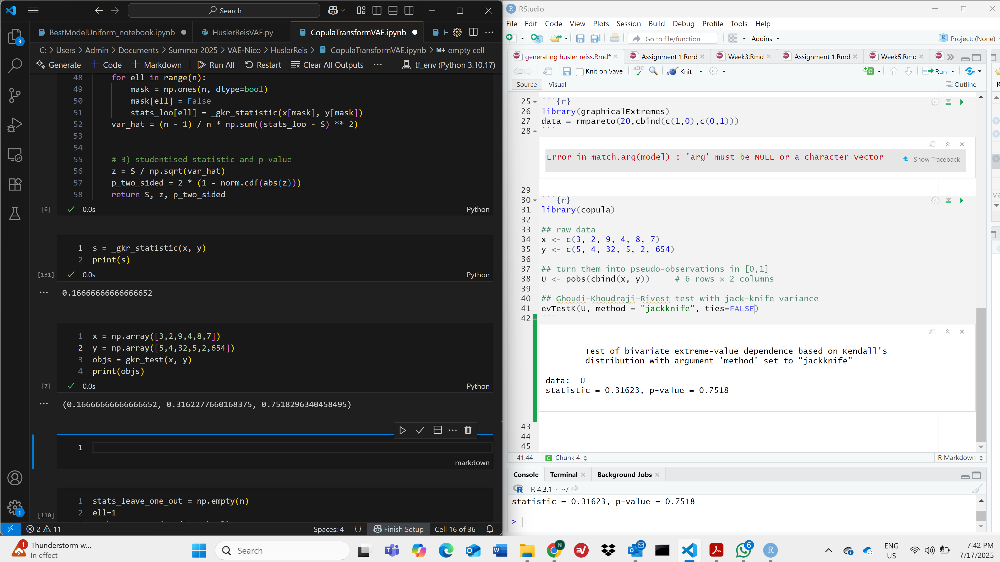

For a sanity check, let's run the test on our original Husler-Reis data.

In [32]:
# on 500 points
dataHR = np.load('husler_reiss_samples.npy')
sanity_500 = gkr_test(dataHR[:,0][0:500], dataHR[:,1][0:500])
print(sanity_500)

(-0.013041842721587482, -1.0514798731299984, 0.293038248539915)


In [35]:
# on 1000 points
sanity_1000 = gkr_test(dataHR[:,0][0:1000], dataHR[:,1][0:1000])
print(sanity_1000)

(-0.007427636052886655, -0.9292282167898719, 0.35277082721181374)


In [ ]:
# on 10 000 points
dataHR = np.load('husler_reiss_samples.npy')
sanity = gkr_test(dataHR[:,0][0:10000], dataHR[:,1][0:10000])
print(sanity)

(2.476130578246863, 33.323663005994355, 0.0)


Very wierd, to be continued! It seems that for smaller samples of roughly 1000, the test concludes that we likely have an EV copula

Here's an idea to assess the extremeness of our data:
- If the data is indeed extreme, we would expect the studentized statistic (second output) to follow a standard normal distribution
- Let's take a bunch of samples, evaluate the statistic, and see whether it indeed comes close to normal

Text(0.5, 1.0, 'Histogram of studentized statictic')

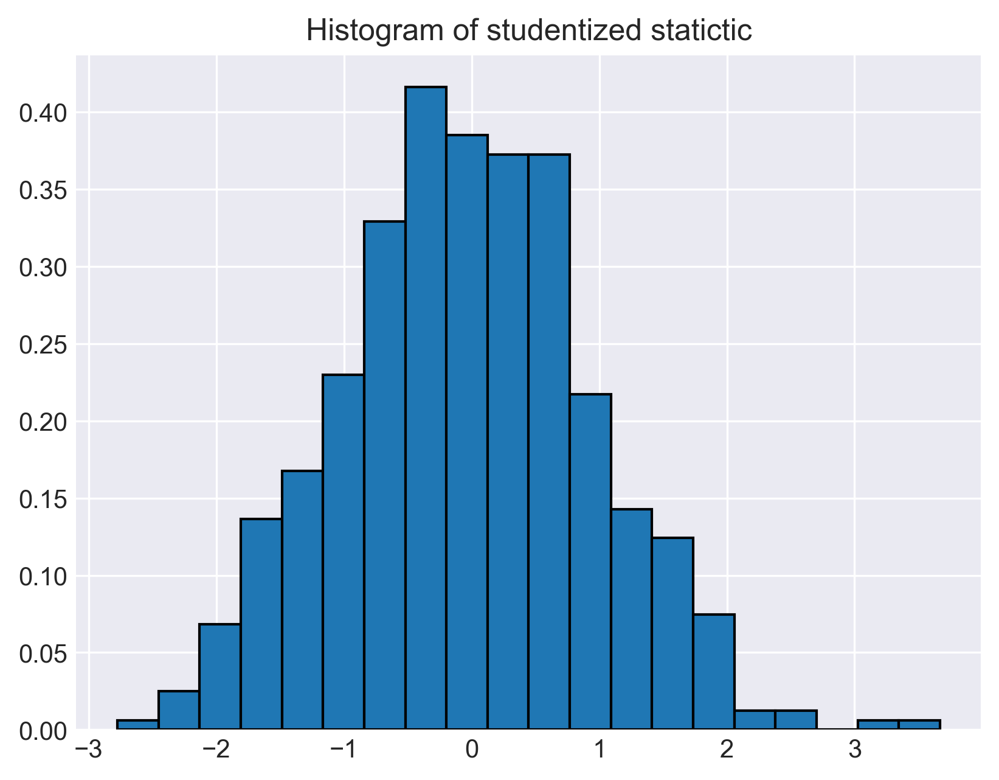

In [53]:
# we take 500 samples of 500 points, compute the studentized statistic and plot the histogram
dataHR_2 = np.load("dataHR_2.npy")
stats_og_cop = []
for i in range(500):
    test_og = gkr_test(dataHR_2[:,0][i*500:(i+1)*500], dataHR_2[:,1][i*500:(i+1)*500])
    stats_og_cop.append(test_og[1])

plt.rcParams['figure.dpi'] = 300
plt.style.use("seaborn-v0_8-darkgrid")
plt.hist(stats_og_cop, bins='auto', edgecolor='black', density=True)
plt.title(f'Histogram of studentized statictic')

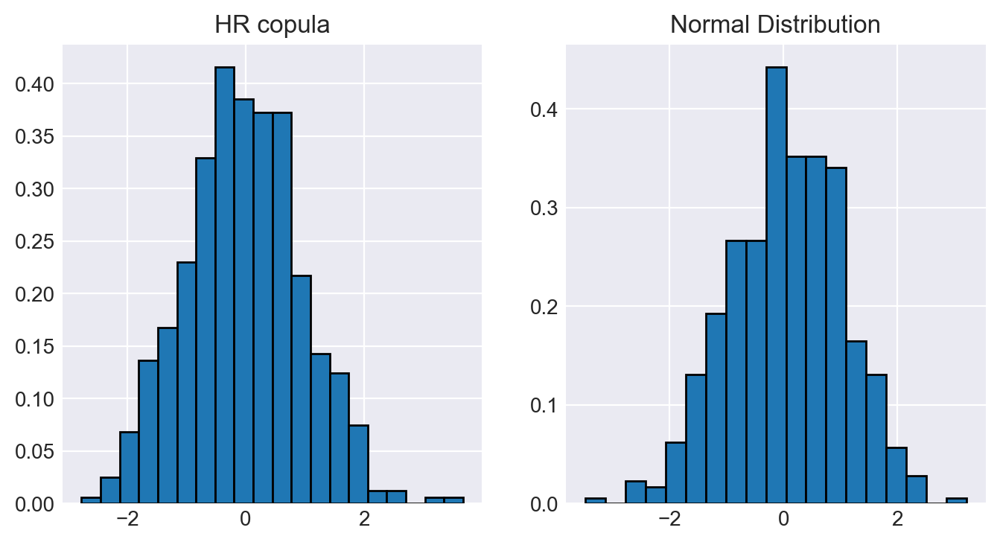

In [54]:
normal = np.random.randn(500)

num_rows = 1
num_cols = 2
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)

axes[0].hist(stats_og_cop, bins='auto', edgecolor='black', density=True)
axes[0].set_title(f'HR copula')
axes[1].hist(normal, bins='auto', edgecolor='black', density=True)
axes[1].set_title(f'Normal Distribution')

plt.show()


We see the expected normal shape. Now, let's do similar plots on the generated data with the ReLU and sigmoid activation functions.

In [55]:
# training ReLU VAE
vae_relu = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'relu')
vae_relu.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
        loss=negative_log_likelihood)
vae_relu.fit(dataHR_2[0:15000], dataHR_2[0:15000], batch_size=32, epochs=100)

# training sigmoid VAE
vae_sigmoid = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'sigmoid')
vae_sigmoid.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
        loss=negative_log_likelihood)
vae_sigmoid.fit(dataHR_2[0:15000], dataHR_2[0:15000], batch_size=32, epochs=100)

Epoch 1/100
469/469 [==============================] - 8s 4ms/step - loss: 0.8908
Epoch 2/100
469/469 [==============================] - 2s 3ms/step - loss: 0.4245
Epoch 3/100
469/469 [==============================] - 2s 4ms/step - loss: 0.3769
Epoch 4/100
469/469 [==============================] - 2s 3ms/step - loss: 0.3378
Epoch 5/100
469/469 [==============================] - 2s 3ms/step - loss: 0.3160
Epoch 6/100
469/469 [==============================] - 2s 4ms/step - loss: 0.2998
Epoch 7/100
469/469 [==============================] - 2s 4ms/step - loss: 0.2799
Epoch 8/100
469/469 [==============================] - 2s 4ms/step - loss: 0.2687
Epoch 9/100
469/469 [==============================] - 2s 3ms/step - loss: 0.2482
Epoch 10/100
469/469 [==============================] - 2s 4ms/step - loss: 0.2354
Epoch 11/100
469/469 [==============================] - 2s 4ms/step - loss: 0.2035
Epoch 12/100
469/469 [==============================] - 2s 3ms/step - loss: 0.0698
Epoch 13/100


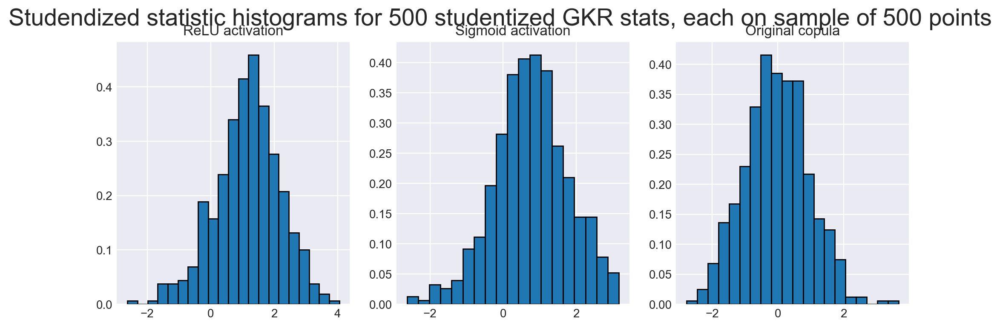

In [57]:

stats_relu = []
for i in range(500):
    prior_sample = vae_relu.encoder.prior.sample(500)
    generated_relu = vae_relu.decoder(prior_sample).sample()
    relu_unif_1 = ECDF(np.array(generated_relu[:, 0]))(np.array(generated_relu[:, 0]))
    relu_unif_2 = ECDF(np.array(generated_relu[:, 1]))(np.array(generated_relu[:, 1]))
    sample_gkr = gkr_test(relu_unif_1, relu_unif_2)
    stats_relu.append(sample_gkr[1])
            
stats_sigmoid = []
for i in range(500):
    prior_sample = vae_sigmoid.encoder.prior.sample(500)
    generated_sigmoid = vae_sigmoid.decoder(prior_sample).sample()
    sigmoid_unif_1 = ECDF(np.array(generated_sigmoid[:, 0]))(np.array(generated_sigmoid[:, 0]))
    sigmoid_unif_2 = ECDF(np.array(generated_sigmoid[:, 1]))(np.array(generated_sigmoid[:, 1]))
    sample_gkr = gkr_test(sigmoid_unif_1, sigmoid_unif_2)
    stats_sigmoid.append(sample_gkr[1])

num_rows = 1
num_cols = 3
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)

axes[0].hist(stats_relu, bins='auto', edgecolor='black', density=True)
axes[0].set_title(f'ReLU activation')
axes[1].hist(stats_sigmoid, bins='auto', edgecolor='black', density=True)
axes[1].set_title(f'Sigmoid activation')
axes[2].hist(stats_og_cop, bins='auto', edgecolor='black', density=True)
axes[2].set_title(f'Original copula')

fig.suptitle("Studendized statistic histograms for 500 studentized GKR stats, each on sample of 500 points", fontsize=20)
plt.show()


Now, we implement the following experiment with a 'validation loss' consisting of the p-value of generated data. Each epoch, we generate some 500 points, compute the p-value and we will save the model that gives us the highest p-value.

In [22]:
# We create a callbacks class that will save the p-value at the end of each epoch
class log_p_value(tf.keras.callbacks.Callback):
    def __init__(self):
        self.p_value_hist = []

    def on_epoch_end(self, epoch, logs=None):
        # generate 500 points
        prior = self.model.encoder.prior.sample(500)
        gen = self.model.decoder(prior).sample()

        # apply copula transform
        unif_1 = ECDF(np.array(gen[:,0]))(np.array(gen[:,0]))
        unif_2 = ECDF(np.array(gen[:,1]))(np.array(gen[:,1]))

        # compute the p-value
        p_val = gkr_test(unif_1, unif_2)[2]

        # log it
        logs['p_value'] = p_val
        self.p_value_hist.append(p_val)

        # we display a dynamic plot
        plt.figure(figsize=(6, 4))
        plt.plot(self.p_value_hist)
        plt.xlabel('Epoch')
        plt.ylabel('Score')
        plt.title('GKR test p-value on sample of 500 points over epochs')
        plt.legend()
        plt.grid(True)
        display.clear_output(wait=True)
        display.display(plt.gcf())
        plt.close()

# Next we create the model checkpoint that will save the best model for us
mc = tf.keras.callbacks.ModelCheckpoint(
    filepath = 'highest_p_value',
    monitor = 'p_value',
    mode = 'max',
    save_best_only = True,
    save_weights_only = True
)

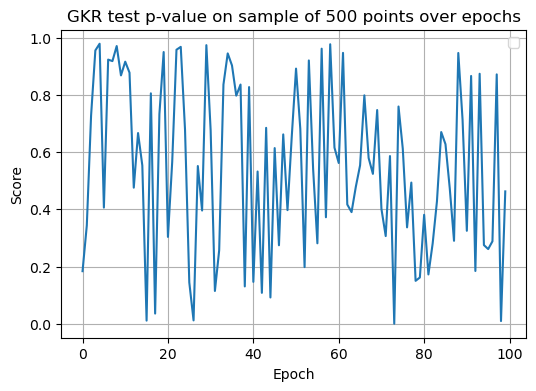

469/469 [==============================] - 5s 12ms/step - loss: 0.3742 - p_value: 0.4626


In [ ]:
# and now, we run our model on 100 epochs and save the one with the highest p-value!
vae_highest_p_val = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'sigmoid')
vae_highest_p_val.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
        loss=negative_log_likelihood)
vae_highest_p_val.fit(dataHR_2[0:15000], dataHR_2[0:15000], batch_size=32, epochs=100, callbacks = [log_p_value(), mc])


And now we check what the copula looks like for the highest p-value and the histogram of the 500 samples of 500 points

Text(0.5, 0.98, 'Experimenting with highest P-value model')

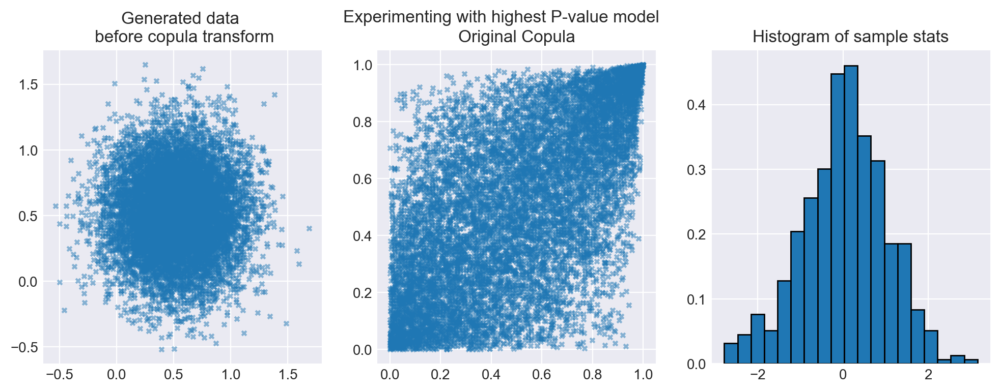

In [17]:
# plot simulated data
highest_p = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'sigmoid')
highest_p.load_weights("highest_p_value")

prior_sample = highest_p.encoder.prior.sample(10000)
# gen will be plotted
gen = highest_p.decoder(prior_sample).sample()

# data passed through copula transform will be plotted
unif_1 = ECDF(np.array(gen[:, 0]))(np.array(gen[:, 0]))
unif_2 = ECDF(np.array(gen[:, 1]))(np.array(gen[:, 1]))

# histogram of sample statistics will be potted
stats_highest_p = []
for i in range(500):
    prior_sample = highest_p.encoder.prior.sample(500)
    generated = highest_p.decoder(prior_sample).sample()
    unif_1 = ECDF(np.array(generated[:, 0]))(np.array(generated[:, 0]))
    unif_2 = ECDF(np.array(generated[:, 1]))(np.array(generated[:, 1]))
    sample_gkr = gkr_test(unif_1, unif_2)
    stats_highest_p.append(sample_gkr[1])

num_rows = 1
num_cols = 3
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
plt.style.use("seaborn-v0_8-darkgrid")
axes[0].scatter(gen[:,0], gen[:,1], s=10, marker='x', alpha=0.5)
axes[0].set_title(f"Generated data \n before copula transform")
axes[1].scatter(dataHR_2[:,0][0:10000], dataHR_2[:,1][0:10000], s=10, marker='x', alpha=0.5)
axes[1].set_title("Original Copula")
axes[2].hist(stats_highest_p, bins='auto', edgecolor='black', density=True)
axes[2].set_title(f'Histogram of sample stats')
fig.suptitle("Experimenting with highest P-value model")

Okay, well clearly the highest p-value was obtained by fluke in the first few epochs when the network wasn't trained enough. To address this, we add a minimum number of epochs after which we save.

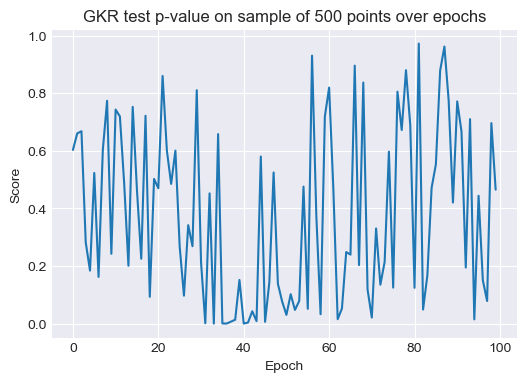

469/469 [==============================] - 2s 3ms/step - loss: -0.5773 - p_value: 0.4650


In [ ]:
class ModelCheckpointAfter(tf.keras.callbacks.ModelCheckpoint):
    """
    Behaves exactly like tf.keras.callbacks.ModelCheckpoint *except*
    it only starts monitoring & saving once (epoch + 1) >= min_epochs.
    """
    def __init__(self, min_epochs: int = 5, **kwargs):
        super().__init__(**kwargs)
        self.min_epochs = min_epochs

    def on_epoch_end(self, epoch, logs=None):
        # epoch is zero-based inside Keras, so add 1 when comparing
        if (epoch + 1) >= self.min_epochs:
            super().on_epoch_end(epoch, logs)
        # else: silently skip saving during the warm-up phase

mc_cb = ModelCheckpointAfter(
    min_epochs      = 20,               # wait until >=10 epochs
    filepath        = "highest_p_value",# (add .h5 or .ckpt if you like)
    monitor         = "p_value",
    mode            = "max",
    save_best_only  = True,
    save_weights_only = True
)

# and now, we run our model on 100 epochs and save the one with the highest p-value!
vae_highest_p_val = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'sigmoid')
vae_highest_p_val.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
        loss=negative_log_likelihood)
vae_highest_p_val.fit(dataHR_2[0:15000], dataHR_2[0:15000], batch_size=32, epochs=100, callbacks = [log_p_value(), mc_cb])

And do the same process we did just before:

Text(0.5, 0.98, 'Experimenting with highest P-value model')

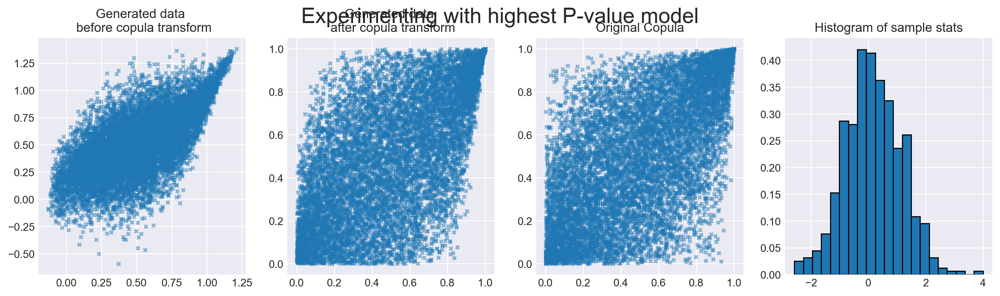

In [30]:
# plot simulated data
highest_p = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'sigmoid')
highest_p.load_weights("highest_p_value")

prior_sample = highest_p.encoder.prior.sample(10000)
# gen will be plotted
gen = highest_p.decoder(prior_sample).sample()

# data passed through copula transform will be plotted
unif_1 = ECDF(np.array(gen[:, 0]))(np.array(gen[:, 0]))
unif_2 = ECDF(np.array(gen[:, 1]))(np.array(gen[:, 1]))

# histogram of sample statistics will be potted
stats_highest_p = []
for i in range(500):
    prior_sample = highest_p.encoder.prior.sample(500)
    generated = highest_p.decoder(prior_sample).sample()
    uni_1 = ECDF(np.array(generated[:, 0]))(np.array(generated[:, 0]))
    uni_2 = ECDF(np.array(generated[:, 1]))(np.array(generated[:, 1]))
    sample_gkr = gkr_test(uni_1, uni_2)
    stats_highest_p.append(sample_gkr[1])

num_rows = 1
num_cols = 4
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
plt.style.use("seaborn-v0_8-darkgrid")
axes[0].scatter(gen[:,0], gen[:,1], s=10, marker='x', alpha=0.5)
axes[0].set_title(f"Generated data \n before copula transform")
axes[1].scatter(unif_1, unif_2, s=10, marker='x', alpha=0.5)
axes[1].set_title(f"Generated data \n after copula transform")
axes[2].scatter(dataHR_2[:,0][0:10000], dataHR_2[:,1][0:10000], s=10, marker='x', alpha=0.5)
axes[2].set_title("Original Copula")
axes[3].hist(stats_highest_p, bins='auto', edgecolor='black', density=True)
axes[3].set_title(f'Histogram of sample stats')
fig.suptitle("Experimenting with highest P-value model", fontsize=20)

This copula does seem to generate a nice Gaussian histogram. Next step: maybe we can use it to generate some actual data and assess if extreme values do in fact occur?

## This marks the end of this experience. We continue in the next notebook "multivariate_copula_transform.ipynb", where we will work with data from a 5-dimensional Hüsler-Reiss copula. And conduct similar pairwise experiments to see if our VAE can learn the dependence when there are more than two dimensions.

## Another experiment we will do in another notebook (financial_data_experiment.ipynb) will be to try to use our VAE to learn the dependence between the returns of a pair of stocks on the stock market.

# IGNORE REST

Now that our re-implementation of the GKR test passes basic sanity checks, let's use it on the data we've generated with our Copula to see how close it comes to being an EV copula! Let's start with the ReLU activation.

In [ ]:
dataHR = np.load('husler_reiss_samples.npy')
negative_log_likelihood = lambda x, rv_x: -rv_x.log_prob(x)
vae_relu = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'relu')
vae_relu.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
         loss=negative_log_likelihood)
vae_relu.fit(dataHR, dataHR, batch_size=32, epochs=100)
prior_sample = vae_relu.encoder.prior.sample(10000)
generated_relu = vae_relu.decoder(prior_sample).sample()
relu_stats = gkr_test(generated_relu[:,0], generated_relu[:,1])
print(relu_stats)

Epoch 1/100

469/469 [==============================] - 7s 3ms/step - loss: 0.8025
Epoch 2/100
469/469 [==============================] - 1s 3ms/step - loss: 0.3702
Epoch 3/100
469/469 [==============================] - 1s 3ms/step - loss: 0.2917
Epoch 4/100
469/469 [==============================] - 2s 3ms/step - loss: 0.2077
Epoch 5/100
469/469 [==============================] - 2s 3ms/step - loss: -0.1001
Epoch 6/100
469/469 [==============================] - 1s 3ms/step - loss: -0.7027
Epoch 7/100
469/469 [==============================] - 1s 3ms/step - loss: -0.9078
Epoch 8/100
469/469 [==============================] - 2s 3ms/step - loss: -0.9740
Epoch 9/100
469/469 [==============================] - 1s 3ms/step - loss: -0.9961
Epoch 10/100
469/469 [==============================] - 2s 3ms/step - loss: -1.0113
Epoch 11/100
469/469 [==============================] - 1s 3ms/step - loss: -1.0278
Epoch 12/100
469/469 [==============================] - 1s 3ms/step - loss: -1.0530
Epoc

The output of the test is (2.449582539380163, 33.487006038227534, 0.0). This means:
- The raw $S_n^{GKR}$ statistic is 2.45
- The studentised statistic $Z_n = \frac{S_n}{\sqrt{\hat{Var}(S_n)}}$ is 33.49
- The two-sided p-value is 0
So this would suggest to reject the null hypothesis I.E. the sample is NOT from an EV copula
Let's try with a smaller sample:

In [34]:
vae_relu = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'relu')
vae_relu.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
         loss=negative_log_likelihood)
vae_relu.fit(dataHR, dataHR, batch_size=32, epochs=100)
prior_sample = vae_relu.encoder.prior.sample(1000)
generated_relu = vae_relu.decoder(prior_sample).sample()
relu_stats = gkr_test(generated_relu[:,0], generated_relu[:,1])
print(relu_stats)

Epoch 1/100
469/469 [==============================] - 4s 1ms/step - loss: 0.7798
Epoch 2/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3467
Epoch 3/100
469/469 [==============================] - 1s 1ms/step - loss: 0.2857
Epoch 4/100
469/469 [==============================] - 1s 1ms/step - loss: 0.2412
Epoch 5/100
469/469 [==============================] - 1s 1ms/step - loss: 0.2033
Epoch 6/100
469/469 [==============================] - 1s 1ms/step - loss: 0.1703
Epoch 7/100
469/469 [==============================] - 1s 1ms/step - loss: 0.0652
Epoch 8/100
469/469 [==============================] - 1s 1ms/step - loss: -0.1551
Epoch 9/100
469/469 [==============================] - 1s 1ms/step - loss: -0.7108
Epoch 10/100
469/469 [==============================] - 1s 1ms/step - loss: -0.9166
Epoch 11/100
469/469 [==============================] - 1s 1ms/step - loss: -0.9650
Epoch 12/100
469/469 [==============================] - 1s 1ms/step - loss: -1.0029
Epoch 13

So unfortunately, it seems that our generated data does not come from an EV copula with the ReLU activation. Let's try to see what happens with the sigmoid activation.

In [36]:
vae_sigmoid = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'sigmoid')
vae_sigmoid.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
         loss=negative_log_likelihood)
vae_sigmoid.fit(dataHR, dataHR, batch_size=32, epochs=100)
prior_sample = vae_sigmoid.encoder.prior.sample(1000)
generated_sigmoid = vae_sigmoid.decoder(prior_sample).sample()
sigmoid_stats = gkr_test(generated_sigmoid[:,0], generated_sigmoid[:,1])
print(sigmoid_stats)

Epoch 1/100
469/469 [==============================] - 3s 1ms/step - loss: 0.6062
Epoch 2/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3560
Epoch 3/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3593
Epoch 4/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3576
Epoch 5/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3580
Epoch 6/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3568
Epoch 7/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3587
Epoch 8/100
469/469 [==============================] - 1s 2ms/step - loss: 0.3572
Epoch 9/100
469/469 [==============================] - 1s 2ms/step - loss: 0.3572
Epoch 10/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3580
Epoch 11/100
469/469 [==============================] - 1s 2ms/step - loss: 0.3553
Epoch 12/100
469/469 [==============================] - 1s 1ms/step - loss: 0.3540
Epoch 13/100


So in this case, the test does not tell us to reject the null hypothesis that the data could come from an EV copula! Let's try several test on both to see if we got this by fluke or if maybe we are onto something!

In [37]:
for i in range(5):
    prior_sample = vae_sigmoid.encoder.prior.sample(1000)
    generated_sigmoid = vae_sigmoid.decoder(prior_sample).sample()
    sigmoid_stats = gkr_test(generated_sigmoid[:,0], generated_sigmoid[:,1])
    print(sigmoid_stats)

(0.012158880323208887, 1.5948940199788635, 0.11073593711736307)
(0.006865733468939705, 0.8985221122650046, 0.36890726194709567)
(0.00827510075205451, 1.0710085460809682, 0.28416558701701145)
(0.00462133275560106, 0.5528329691424573, 0.5803777904722649)
(0.005247335511864737, 0.5773765974855555, 0.5636850797944111)


Let's do the same for ReLU

In [38]:
for i in range(5):
    prior_sample = vae_relu.encoder.prior.sample(1000)
    generated_relu = vae_relu.decoder(prior_sample).sample()
    relu_stats = gkr_test(generated_relu[:,0], generated_relu[:,1])
    print(relu_stats)

(0.009874724423822645, 1.007084402894158, 0.3138942157709814)
(0.022902776524019064, 2.241285777950528, 0.025007569599486024)
(0.003865691342645139, 0.41913386998243685, 0.675118298646971)
(0.010612654738907157, 1.1827385061866247, 0.23691279841056656)
(0.00488192400817633, 0.5742386138608481, 0.5658063426748274)


The following cells are just print statements for debugging, can be ingonred

In [110]:
stats_leave_one_out = np.empty(n)
ell=1
mask = np.ones(n, dtype=bool)
mask[ell] = False
print(mask)

[ True False  True  True  True  True]


In [111]:
print(x[mask])

[3 9 4 8 7]


In [3]:
import numpy as np
from scipy.stats import rankdata, norm
x = np.array([3,2,9,4,8,7]) #2,3,4,7,8,9 #2,1,6,3,5,4
y = np.array([5,4,32,5,2,654])
rx = rankdata(x, method="average")
ry = rankdata(y, method="ordinal")
print(rx)
print(rx[:, None])
print(rx[None, :])

[2. 1. 6. 3. 5. 4.]
[[2.]
 [1.]
 [6.]
 [3.]
 [5.]
 [4.]]
[[2. 1. 6. 3. 5. 4.]]


In [90]:
print(3 >= rx[None, :])

[[ True  True False  True False False]]


In [92]:
print(ry)

[3 2 5 4 1 6]


In [91]:
print(rx[:, None] >= rx[None, :])
print(ry[:, None] >= ry[None, :])

[[ True  True False False False False]
 [False  True False False False False]
 [ True  True  True  True  True  True]
 [ True  True False  True False False]
 [ True  True False  True  True  True]
 [ True  True False  True False  True]]
[[ True  True False False  True False]
 [False  True False False  True False]
 [ True  True  True  True  True False]
 [ True  True False  True  True False]
 [False False False False  True False]
 [ True  True  True  True  True  True]]


In [98]:
print((rx[:, None] >= rx[None, :]) & (ry[:, None] >= ry[None, :]))
I = ((rx[:, None] >= rx[None, :]) &
         (ry[:, None] >= ry[None, :])).astype(np.int8)
print(I)

[[ True  True False False False False]
 [False  True False False False False]
 [ True  True  True  True  True False]
 [ True  True False  True False False]
 [False False False False  True False]
 [ True  True False  True False  True]]
[[1 1 0 0 0 0]
 [0 1 0 0 0 0]
 [1 1 1 1 1 0]
 [1 1 0 1 0 0]
 [0 0 0 0 1 0]
 [1 1 0 1 0 1]]


In [99]:
np.fill_diagonal(I, 0)
print(I)

[[0 1 0 0 0 0]
 [0 0 0 0 0 0]
 [1 1 0 1 1 0]
 [1 1 0 0 0 0]
 [0 0 0 0 0 0]
 [1 1 0 1 0 0]]


In [100]:
A = I.sum()
print(A)

10


In [101]:
c = I.sum(axis=0)          # c_j
B = np.sum(c * (c - 1))

print(c)
print(B)

[3 4 0 2 1 0]
20


In [102]:
n = x.size
S = (-1 + 8.0 * A / (n * (n - 1)) - 9.0 * B / (n * (n - 1) * (n - 2)))
print(S)

0.16666666666666652


In [113]:
gkr_test(x, y, method="jackknife")

ValueError: Need at least 3 observations

In [103]:
stats_leave_one_out = np.empty(n)
print(stats_leave_one_out)

[2.0e-323 4.9e-324 0.0e+000 1.5e-323 9.9e-324 2.5e-323]


In [107]:
print(np.empty(4))

[-835.1875  -52.      835.1875    0.    ]


In [59]:
import copulas

In [60]:
from copulas.multivariate import GumbelCopula, ClaytonCopula

np.random.seed(321)
n = 200

# Sample from a *true EV* copula (Gumbel, θ=3)
g = GumbelCopula(theta=3)
ug = g.sample(n)
stat, z, p = gkr_test(ug[:,0], ug[:,1])
print(f"Gumbel sample: p-value = {p:.3f} (fail to reject H_E)")

# Sample from a copula that is *not* extreme-value (Clayton, θ=3)
c = ClaytonCopula(theta=3)
uc = c.sample(n)
stat, z, p = gkr_test(uc[:,0], uc[:,1])
print(f"Clayton sample: p-value = {p:.3e} (reject H_E)")

ImportError: cannot import name 'GumbelCopula' from 'copulas.multivariate' (c:\Users\Admin\anaconda3\envs\tf_env\lib\site-packages\copulas\multivariate\__init__.py)

Let's try to train the regular VAE over more epochs and include a validation set. Perhaps we will get even closer in shape.

Epoch 1/300
469/469 [==============================] - 4s 3ms/step - loss: 0.8717 - val_loss: 0.4628
Epoch 2/300
469/469 [==============================] - 1s 2ms/step - loss: 0.3595 - val_loss: 0.3596
Epoch 3/300
469/469 [==============================] - 1s 2ms/step - loss: 0.2939 - val_loss: 0.2864
Epoch 4/300
469/469 [==============================] - 1s 2ms/step - loss: 0.2422 - val_loss: 0.2089
Epoch 5/300
469/469 [==============================] - 1s 2ms/step - loss: 0.1738 - val_loss: 0.1334
Epoch 6/300
469/469 [==============================] - 1s 2ms/step - loss: 0.0104 - val_loss: -0.1987
Epoch 7/300
469/469 [==============================] - 1s 2ms/step - loss: -0.5846 - val_loss: -0.7728
Epoch 8/300
469/469 [==============================] - 1s 2ms/step - loss: -0.8675 - val_loss: -0.9210
Epoch 9/300
469/469 [==============================] - 1s 2ms/step - loss: -0.9382 - val_loss: -0.9675
Epoch 10/300
469/469 [==============================] - 1s 2ms/step - loss: -0.9787 

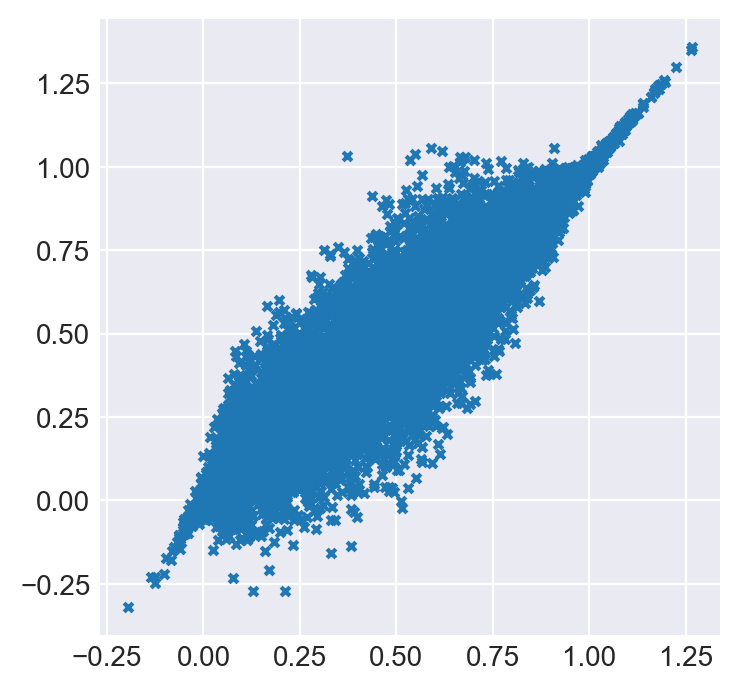

In [69]:
eval_dataHR = np.load('husler_reiss_samples_eval.npy')
best_model_callback = ModelCheckpoint(filepath = "best_model_regular",
                                      save_weights_only = True,
                                      monitor = 'val_loss',
                                      mode = 'min',
                                      save_best_only = True)
vae_reg_val = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4)
vae_reg_val.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
            loss=negative_log_likelihood)
vae_reg_val.fit(dataHR,dataHR, validation_data = (eval_dataHR, eval_dataHR),
        batch_size=32, epochs=300,
        callbacks = [best_model_callback]
        )

best_regular = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4)
best_regular.load_weights("best_model_regular")

prior_sample = best_regular.encoder.prior.sample(10000)
generated_best_regular = best_regular.decoder(prior_sample).sample()

plt.style.use("seaborn-v0_8-darkgrid")
plt.figure(figsize=(4, 4), dpi=200)
plt.scatter(generated_best_regular[:,0], generated_best_regular[:,1], marker="x", s=10)

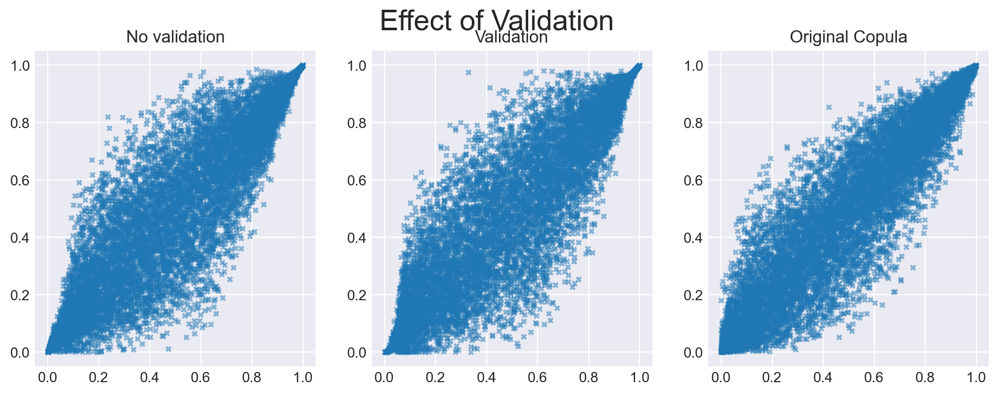

In [70]:
ecdf_m_1 = ECDF(np.array(generated_best_regular[:, 0]))
ecdf_m_2 = ECDF(np.array(generated_best_regular[:, 1]))

# new data, but with uniform margins
u_dim_1 = ecdf_margin_1(np.array(generated_best_regular[:, 0]))
u_dim_2 = ecdf_margin_2(np.array(generated_best_regular[:, 1]))

num_rows = 1
num_cols = 3
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
axes[0].scatter(unif_dim_1_no_logit, unif_dim_2_no_logit, s=10, marker='x', alpha=0.5)
axes[0].set_title('No validation')
axes[1].scatter(u_dim_1, u_dim_2, s=10, marker='x', alpha=0.5)
axes[1].set_title('Validation')
axes[2].scatter(dataHR[:,0][0:10000], dataHR[:,1][0:10000], s=10, marker='x', alpha=0.5)
axes[2].set_title('Original Copula')
fig.suptitle("Effect of Validation", fontsize = 20)
plt.show()



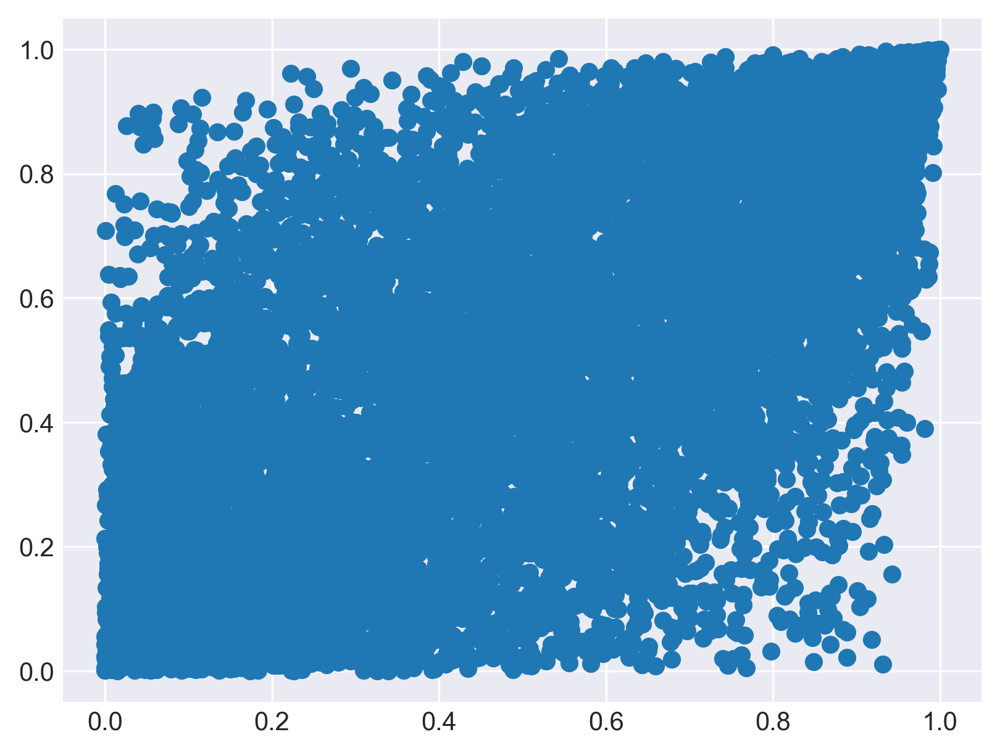

In [47]:
dataHR_2 = np.load("dataHR_2.npy")
plt.scatter(dataHR_2[:,0][0:10000], dataHR_2[:,1][0:10000])

Epoch 1/100
469/469 [==============================] - 7s 3ms/step - loss: 0.6527
Epoch 2/100
469/469 [==============================] - 2s 3ms/step - loss: 0.3887
Epoch 3/100
469/469 [==============================] - 2s 3ms/step - loss: 0.3883
Epoch 4/100
469/469 [==============================] - 2s 4ms/step - loss: 0.3867
Epoch 5/100
469/469 [==============================] - 2s 4ms/step - loss: 0.3880
Epoch 6/100
469/469 [==============================] - 2s 4ms/step - loss: 0.3843
Epoch 7/100
469/469 [==============================] - 2s 3ms/step - loss: 0.3858
Epoch 8/100
469/469 [==============================] - 2s 3ms/step - loss: 0.3853
Epoch 9/100
469/469 [==============================] - 2s 3ms/step - loss: 0.3822
Epoch 10/100
469/469 [==============================] - 2s 4ms/step - loss: 0.3847
Epoch 11/100
469/469 [==============================] - 2s 3ms/step - loss: 0.3849
Epoch 12/100
469/469 [==============================] - 2s 3ms/step - loss: 0.3836
Epoch 13/100


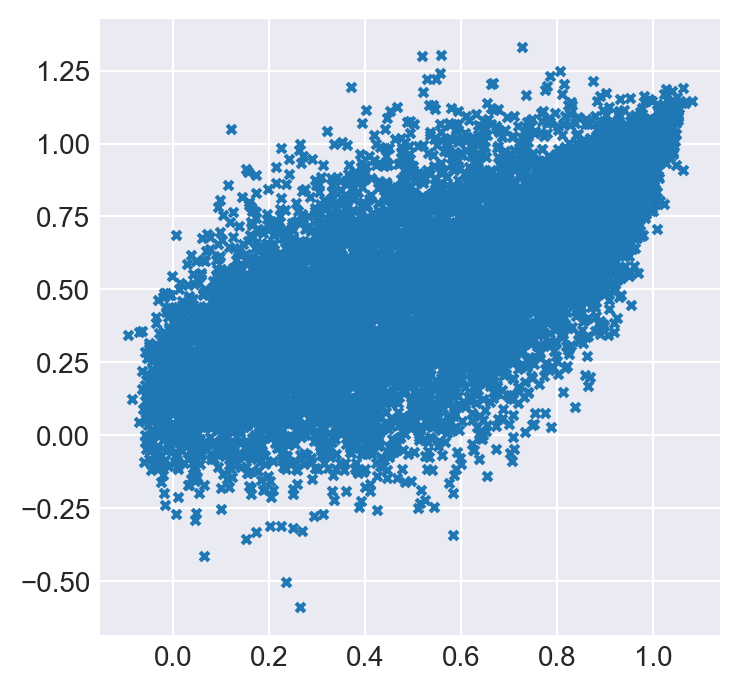

In [51]:
vae = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'sigmoid')
vae.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
        loss=negative_log_likelihood)
vae.fit(dataHR_2[0:15000], dataHR_2[0:15000], batch_size=32, epochs=100)
prior_sample = vae.encoder.prior.sample(10000)
generated = vae.decoder(prior_sample).sample()
unif_marg_1 = ECDF(np.array(generated[:, 0]))(np.array(generated[:, 0]))
unif_marg_2 = ECDF(np.array(generated[:, 1]))(np.array(generated[:, 1]))

plt.style.use("seaborn-v0_8-darkgrid")
plt.figure(figsize=(4, 4), dpi=200)
plt.scatter(generated[:,0], generated[:,1], marker="x", s=10)

Text(0.5, 1.0, 'Original Copula')

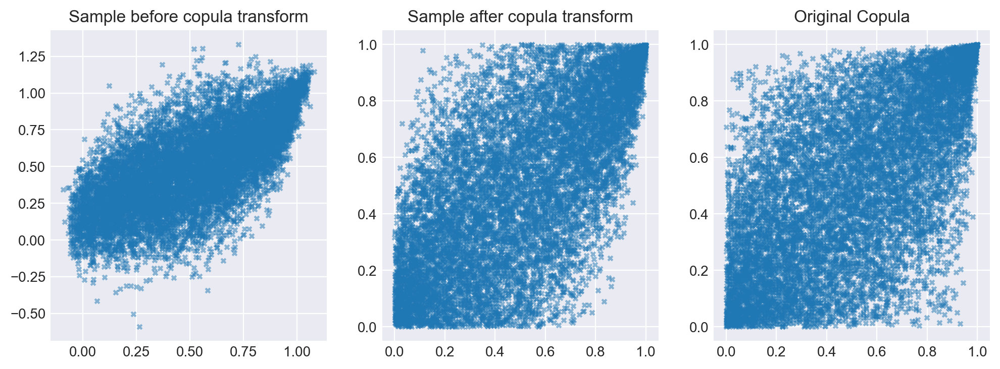

In [52]:
ecdf_margin_1 = ECDF(np.array(generated[:, 0]))
ecdf_margin_2 = ECDF(np.array(generated[:, 1]))

# new data, but with uniform margins
unif_dim_1 = ecdf_margin_1(np.array(generated[:, 0]))
unif_dim_2 = ecdf_margin_2(np.array(generated[:, 1]))

# visuals
num_rows = 1
num_cols = 3
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
axes[0].scatter(generated[:,0], generated[:,1], s=10, marker='x', alpha=0.5)
axes[0].set_title('Sample before copula transform')
axes[1].scatter(unif_dim_1, unif_dim_2, s=10, marker='x', alpha=0.5)
axes[1].set_title('Sample after copula transform')
axes[2].scatter(dataHR_2[:,0][0:10000], dataHR_2[:,1][0:10000], s=10, marker='x', alpha=0.5)
axes[2].set_title('Original Copula')

Try is on yet another copula of strange shape

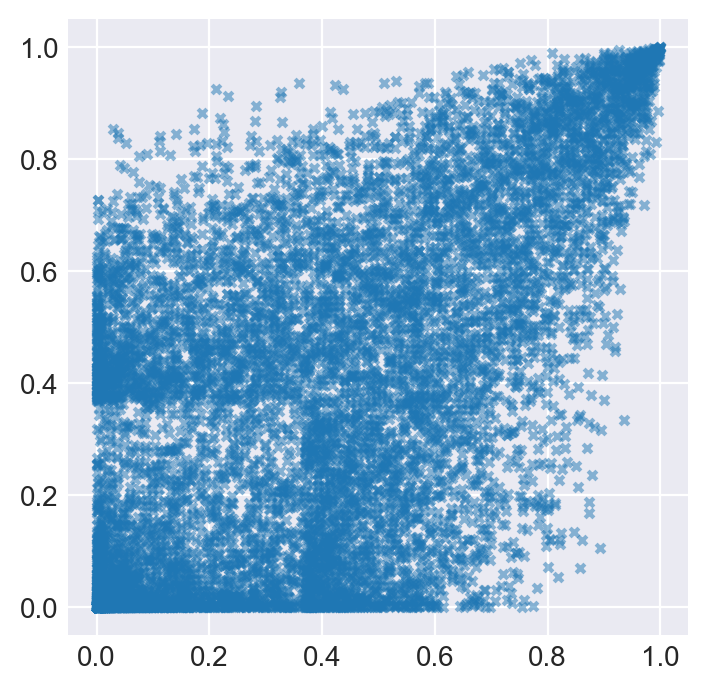

In [62]:
new_data = np.load("HR_5_dim.npy")
marg_1 = new_data[:,3][:, np.newaxis]
marg_2 = new_data[:,4][:, np.newaxis]
frame = np.concatenate((marg_1, marg_2), axis=1)

plt.style.use("seaborn-v0_8-darkgrid")
plt.figure(figsize=(4, 4), dpi=200)
plt.scatter(frame[:,0], frame[:,1], marker="x", s=10, alpha=0.5)

Epoch 1/100
313/313 [==============================] - 6s 4ms/step - loss: 1.7800
Epoch 2/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4527
Epoch 3/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4344
Epoch 4/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4352
Epoch 5/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4340
Epoch 6/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4346
Epoch 7/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4339
Epoch 8/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4336
Epoch 9/100
313/313 [==============================] - 1s 4ms/step - loss: 0.4328
Epoch 10/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4309
Epoch 11/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4327
Epoch 12/100
313/313 [==============================] - 1s 3ms/step - loss: 0.4312
Epoch 13/100


Text(0.5, 1.0, 'OG copula')

<Figure size 800x800 with 0 Axes>

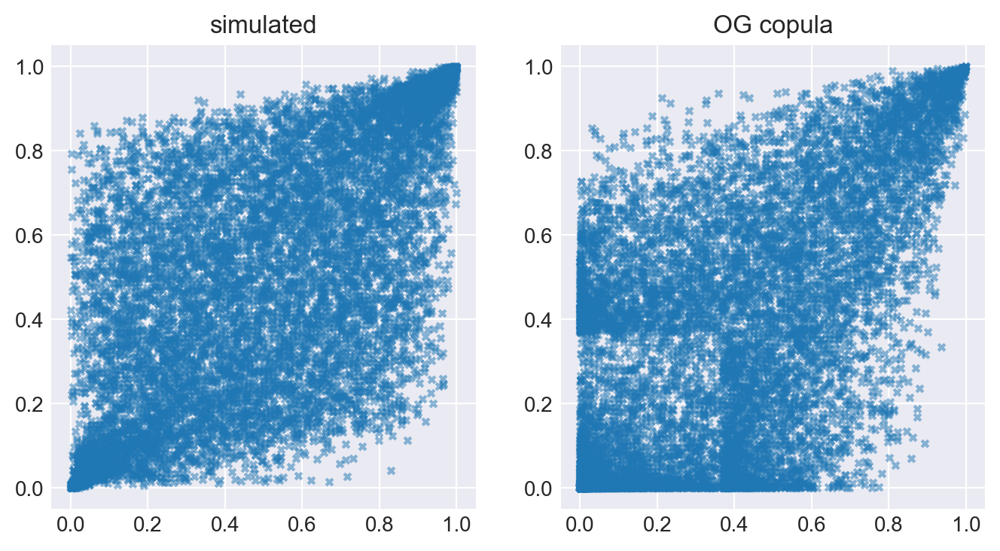

In [63]:
vae = Std_VAE(num_neurons_encoder=20, num_neurons_decoder=20, kl_weight=0.4, activation = 'sigmoid')
vae.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-3),
        loss=negative_log_likelihood)
vae.fit(frame, frame, batch_size=32, epochs=100)
#prior_sample = vae.encoder.prior.sample(10000)
#generated = vae.decoder(prior_sample).sample()
#unif_marg_1 = ECDF(np.array(generated[:, 0]))(np.array(generated[:, 0]))
#unif_marg_2 = ECDF(np.array(generated[:, 1]))(np.array(generated[:, 1]))

sim_frame = vae.generate_n_points(10000)

num_rows = 1
num_cols = 2
plt.style.use("seaborn-v0_8-darkgrid")
plt.figure(figsize=(4, 4), dpi=200)
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
axes[0].scatter(sim_frame[:,0], sim_frame[:,1], marker="x", s=10, alpha=0.5)
axes[0].set_title("simulated")
axes[1].scatter(frame[:,0], frame[:,1], marker="x", s=10, alpha=0.5)
axes[1].set_title("OG copula")

In the graph above, we see unfortunately that our model fails to capture the strange dependence feature occurring at the edge of the $[0,0.37]^2$ rectangle

Text(0.5, 1.0, 'second margin')

<Figure size 800x800 with 0 Axes>

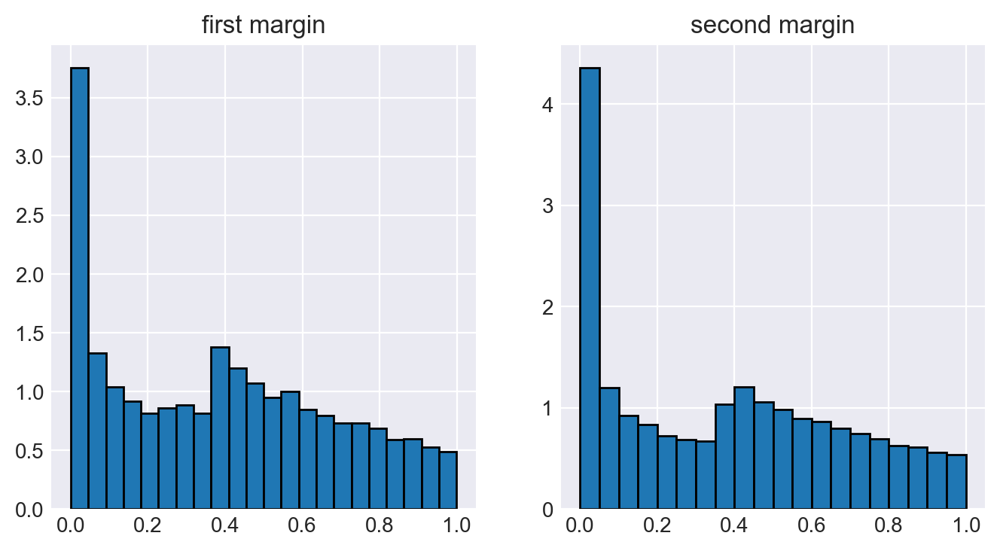

In [53]:
num_rows = 1
num_cols = 2
plt.style.use("seaborn-v0_8-darkgrid")
plt.figure(figsize=(4, 4), dpi=200)
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
axes[0].hist(frame[:,0],bins='auto', edgecolor='black', density=True)
axes[0].set_title("first margin")
axes[1].hist(frame[:,1],bins='auto', edgecolor='black', density=True)
axes[1].set_title("second margin")

In [56]:
print(type(generated))
print(generated.shape)
print(generated.shape[1])

<class 'tensorflow.python.framework.ops.EagerTensor'>
(10000, 2)
2


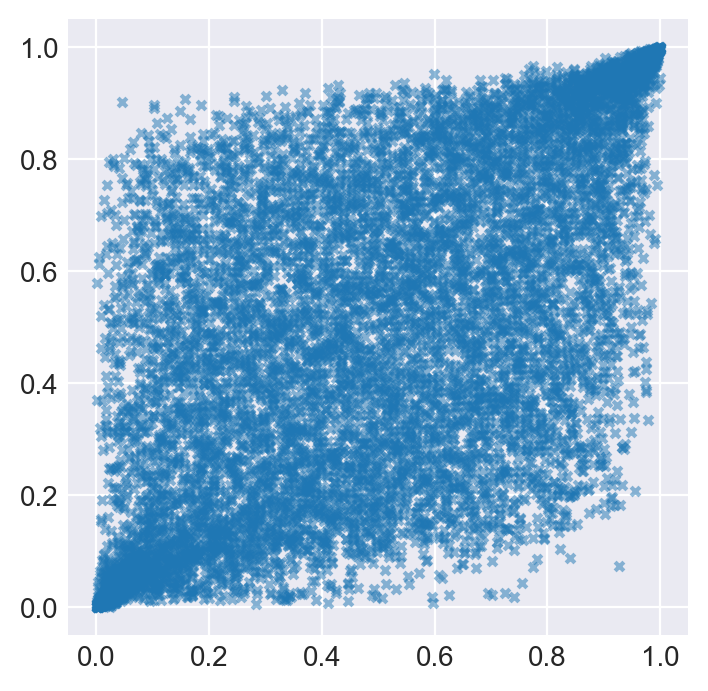

In [58]:
u1 = ECDF(np.array(generated[:,0]))(np.array(generated[:,0]))
u1 = u1[:, np.newaxis]
u2 = ECDF(np.array(generated[:,1]))(np.array(generated[:,1]))
u2 = u2[:, np.newaxis]
frame2 = np.concatenate((u1, u2), axis=1)

plt.style.use("seaborn-v0_8-darkgrid")
plt.figure(figsize=(4, 4), dpi=200)
plt.scatter(frame2[:,0], frame2[:,1], marker="x", s=10, alpha=0.5)

In [60]:
sample = vae.generate_n_points(10000)
plt.style.use("seaborn-v0_8-darkgrid")
plt.figure(figsize=(4, 4), dpi=200)
plt.scatter(sample[:,0], sample[:,1], marker="x", s=10, alpha=0.5)

AttributeError: 'Std_VAE' object has no attribute 'generate_n_points'